In [1]:
import time
import pandas as pd
import seaborn as sns
import numpy as np
import xgboost as xgb
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import r2_score, mean_absolute_error, accuracy_score
import matplotlib.style as style

# Import Wind Data

In [2]:
# Read in wind data
df = pd.read_csv('wind.csv')

In [3]:
df.drop('wind_20_25', axis=1, inplace=True)

# Inspect Wind Data

In [4]:
# Set it so notebook displays all rows and columns
pd.set_option('display.max_rows', None, 'display.max_columns', None)

In [64]:
df.head()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
0,16.856495,1.061215,0.087816,0.622437,1.407608,1.817218,41.864954,378.659703,261.840868,56.655365,1.734247,-0.057055,52.719178,318.383219,240.126256,0.298522,37.927671,89.725650,0.923834,0.180329,897.735502,1.254623,164.708333,2.694384,10.653231,0.240740,0.053540,0.009929,7.505273,6.675066,49.459223,413.456134,337.980810,162.060722,2.855287,7.082299,76.461474,391.383338,324.253801,0.030351,21.703364,38.537420,0.021116,0.012159,5.449458,0.876089,92.462975,1.711048,0.877854,0.122146,0.000000,0.0,0.021005,0.283562,0.280594,0.273630,0.137557,0.003653,25.762866,0.278408
1,5.059189,1.280792,0.131821,0.611629,5.183526,4.396477,45.715525,334.001712,217.700342,145.535616,3.387671,0.164829,60.653995,193.233904,160.373174,0.330345,71.992647,89.652702,0.934469,0.410932,962.258105,1.432283,205.805365,3.454795,13.300750,0.231010,0.142045,0.007222,13.870642,9.661221,57.586323,373.605453,290.831051,251.568423,2.877869,11.718431,92.011630,311.066825,243.442590,0.040881,17.687043,32.800760,0.020605,0.341610,8.438479,1.018654,105.917463,1.864591,0.786872,0.210845,0.002283,0.0,0.367352,0.228196,0.234817,0.159475,0.010160,0.000000,49.331437,0.275160
2,5.630571,1.222809,0.073894,0.628033,3.573379,4.106549,35.521918,368.268607,222.008333,104.964384,3.235046,0.548059,51.557877,242.003995,180.946804,0.331678,67.406495,89.656368,0.929255,0.273014,889.232534,1.037922,199.130137,1.921644,9.482235,0.287816,0.060286,0.014461,12.196875,9.301492,42.248047,400.807997,297.410170,205.782646,3.152209,5.865549,78.991521,350.516764,270.471048,0.041687,23.209125,32.521231,0.018489,0.280606,8.044534,0.471765,113.312728,1.079697,0.983676,0.016324,0.000000,0.0,0.309361,0.359589,0.236187,0.092352,0.002511,0.000000,8.479866,0.266279
3,25.291096,0.589100,0.096508,0.676460,2.780527,2.980692,45.981735,356.270434,281.158562,174.286872,2.301142,19.937100,81.121689,210.523744,217.716210,0.272788,85.802728,89.790836,0.951753,0.135425,1028.251142,3.389498,85.516324,5.700126,1.545494,0.190713,0.041740,0.011028,8.294134,6.815793,51.858350,390.919287,356.999966,328.791504,2.235802,1.651703,120.218920,320.424785,301.013745,0.017799,6.909995,44.603646,0.020745,0.018136,3.810696,0.855698,56.824666,2.226335,0.337443,0.653767,0.008790,0.0,0.000000,0.000000,0.000000,0.999315,0.000685,0.000000,158.365295,0.273641
4,13.760879,1.239275,0.080935,0.610962,1.790161,3.951160,38.991781,391.578995,265.642009,70.910731,2.297717,1.233767,54.611187,309.053767,236.329224,0.290563,47.255938,89.711928,0.925575,0.215808,848.240639,1.335080,194.883105,3.359749,10.369033,0.256079,0.055398,0.012663,7.995101,13.070407,45.543017,421.984514,341.312207,171.902012,3.036264,7.854971,83.956928,393.691507,321.563233,0.026722,22.161880,38.783627,0.029075,0.136581,5.557901,0.869533,84.883755,1.774465,0.831849,0.162671,0.005479,0.0,0.081507,0.292922,0.315753,0.234817,0.075000,0.000000,38.751025,0.413557


In [65]:
df.tail()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
863,17.841804,1.198509,0.123465,0.614277,2.014559,3.364666,48.297032,362.941210,268.356507,73.935274,2.127169,6.051050,60.402740,288.688470,237.992922,0.285225,52.877475,89.739935,0.936426,0.209562,911.373744,1.826176,179.857078,3.684749,10.155600,0.252132,0.085523,0.007359,8.457145,11.217220,57.575491,399.591980,343.754298,184.430205,2.999854,8.693063,86.594760,375.057312,324.512429,0.022972,24.676410,40.489717,0.023205,0.045448,5.657261,1.103122,80.373825,1.750586,0.768379,0.230365,0.001256,0.0,0.029680,0.209132,0.289384,0.333676,0.136758,0.001370,46.655095,0.232862
864,17.841804,1.198509,0.123465,0.614277,2.014559,3.364666,48.297032,362.941210,268.356507,73.935274,2.127169,6.051050,60.402740,288.688470,237.992922,0.285225,52.877475,89.739935,0.936426,0.209562,911.373744,1.826176,179.857078,3.684749,10.155600,0.252132,0.085523,0.007359,8.457145,11.217220,57.575491,399.591980,343.754298,184.430205,2.999854,8.693063,86.594760,375.057312,324.512429,0.022972,24.676410,40.489717,0.023205,0.045448,5.657261,1.103122,80.373825,1.750586,0.768379,0.230365,0.001256,0.0,0.029680,0.209132,0.289384,0.333676,0.136758,0.001370,46.655095,0.227780
865,11.599498,1.129152,0.081946,0.630250,2.956425,4.078306,38.930023,368.248973,236.121689,101.907078,3.089155,-0.439646,54.680251,254.651712,198.311758,0.310162,53.879872,89.684715,0.925806,0.273836,890.854566,1.219566,223.163014,2.507717,11.315673,0.259956,0.050392,0.007084,10.463145,10.228740,45.730339,400.844212,311.504582,204.700125,3.123949,5.594285,81.373736,355.669566,288.268442,0.037311,24.495832,34.728980,0.020482,0.215937,5.941214,0.621892,100.219593,1.694088,0.894178,0.105708,0.000114,0.0,0.109589,0.390753,0.227854,0.193950,0.076712,0.001142,23.332762,0.335691
866,12.940297,1.117873,0.066859,0.632779,1.634768,2.460834,36.796005,400.358219,267.515639,68.382877,1.917694,0.038527,48.693265,329.026826,243.558790,0.294830,44.577943,89.715368,0.911239,0.203397,861.946005,0.977169,219.092808,2.760331,9.684887,0.254711,0.044129,0.008945,8.130707,8.497250,42.634708,429.306709,344.746033,184.061418,2.663718,5.315806,73.550696,407.878378,331.221099,0.027306,25.921266,38.557812,0.024088,0.107024,4.302217,0.495352,101.420073,1.551151,0.897374,0.102626,0.000000,0.0,0.037557,0.377854,0.336187,0.174201,0.074087,0.000114,23.100926,0.115268
867,9.680251,1.288755,0.174748,0.600410,4.915672,4.541239,53.904909,317.304909,230.305594,154.095662,3.488699,5.904703,69.029909,174.216553,167.265525,0.321487,79.985823,89.704506,0.942298,0.273534,982.218836,1.884132,196.730936,3.183630,10.641880,0.206983,0.125862,0.011830,13.553966,10.143598,66.766948,359.140425,303.176979,261.146735,2.967189,10.166926,102.511569,290.876755,253.250432,0.038063,17.125735,35.586446,0.024164,0.251430,7.444586,1.274585,94.073426,1.808814,0.830936,0.168265,0.000799,0.0,0.208904,0.284475,0.272032,0.231621,0.002968,0.000000,41.626348,0.280486


In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 868 entries, 0 to 867
Data columns (total 60 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   avg_air_temperature           868 non-null    float64
 1   avg_alpha                     868 non-null    float64
 2   avg_aod                       868 non-null    float64
 3   avg_asymmetry                 868 non-null    float64
 4   avg_cld_opd_dcomp             868 non-null    float64
 5   avg_cld_reff_dcomp            868 non-null    float64
 6   avg_clearsky_dhi              868 non-null    float64
 7   avg_clearsky_dni              868 non-null    float64
 8   avg_clearsky_ghi              868 non-null    float64
 9   avg_cloud_press_acha          868 non-null    float64
 10  avg_cloud_type                868 non-null    float64
 11  avg_dew_point                 868 non-null    float64
 12  avg_dhi                       868 non-null    float64
 13  avg_d

In [67]:
df.describe()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
count,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000,868.000000
mean,11.063659,1.222972,0.129092,0.613910,3.627783,4.026952,47.023649,345.068531,239.249943,114.891942,2.900293,3.864456,61.108094,231.307411,192.470810,0.309087,67.110566,89.700281,0.932978,0.265548,938.688557,1.645542,198.510037,3.037640,10.728786,0.244434,0.099372,0.009365,11.486003,10.058608,57.818527,383.229774,313.380264,223.817439,2.956965,8.946956,91.056611,335.812240,278.358124,0.033433,20.643947,36.163696,0.024172,0.194374,7.091661,0.995106,94.074399,1.661774,0.836251,0.161199,0.002531,0.000019,0.165605,0.286882,0.280678,0.216379,0.049486,0.000969,39.380531,0.347482
std,4.489935,0.079721,0.032714,0.012387,1.336396,0.953723,5.519396,23.317080,17.084278,29.260221,0.629678,3.784316,5.942538,45.618653,28.116427,0.014744,11.214705,0.025362,0.008541,0.073652,50.549873,0.431927,21.811674,0.920604,1.503490,0.033656,0.031578,0.002965,2.401566,1.306498,7.859657,19.738001,17.926311,27.644399,0.150490,2.157093,8.780417,32.414032,28.217277,0.006569,3.427377,2.566503,0.002645,0.103958,1.172560,0.245164,10.155470,0.427073,0.089073,0.086320,0.004969,0.000225,0.107284,0.077864,0.051580,0.102257,0.048693,0.004118,21.914395,0.074465
min,-2.394064,0.589100,0.061099,0.597451,0.882002,1.566721,34.985274,276.962100,162.567123,45.034132,1.198858,-4.406975,44.875114,97.238584,92.952740,0.267358,37.927671,89.601756,0.909986,0.058548,753.141438,0.783059,85.516324,0.145205,1.471829,0.170622,0.034707,0.004580,5.285467,6.138073,41.174422,328.829245,235.615877,152.561985,2.056548,1.485069,66.543438,208.551863,164.822375,0.016141,5.977417,25.873451,0.017983,0.005998,1.172412,0.418880,35.357868,0.176282,0.253311,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.021096,0.105168
25%,7.554249,1.192602,0.102709,0.605741,2.496658,3.375369,42.860417,327.237243,225.335588,92.315068,2.399686,1.645348,58.033847,197.352140,169.223202,0.297119,58.194447,89.682143,0.928814,0.205329,915.351855,1.423108,186.703111,2.788470,10.100197,0.218610,0.072997,0.007015,9.523767,9.304652,51.847142,368.204441,298.495554,202.568627,2.922788,7.594473,87.395137,311.737488,254.646399,0.028191,18.467264,34.273820,0.021990,0.101998,6.440832,0.827412,88.516429,1.583985,0.784475,0.107306,0.000114,0.000000,0.062100,0.262100,0.256592,0.161758,0.008876,0.000000,24.723298,0.294753
50%,9.843322,1.241442,0.132041,0.610584,3.896297,4.275724,47.758447,339.719521,233.094235,120.369463,3.155537,3.512551,61.508105,219.236244,181.

# Correlations

In [68]:
#Show correlations
df.corr()

,avg_air_temperature,avg_alpha,avg_aod,avg_asymmetry,avg_cld_opd_dcomp,avg_cld_reff_dcomp,avg_clearsky_dhi,avg_clearsky_dni,avg_clearsky_ghi,avg_cloud_press_acha,avg_cloud_type,avg_dew_point,avg_dhi,avg_dni,avg_ghi,avg_ozone,avg_relative_humidity,avg_solar_zenith_angle,avg_ssa,avg_surface_albedo,avg_surface_pressure,avg_total_precipitable_water,avg_wind_direction,avg_wind_speed,std_air_temperature,std_alpha,std_aod,std_asymmetry,std_cld_opd_dcomp,std_cld_reff_dcomp,std_clearsky_dhi,std_clearsky_dni,std_clearsky_ghi,std_cloud_press_acha,std_cloud_type,std_dew_point,std_dhi,std_dni,std_ghi,std_ozone,std_relative_humidity,std_solar_zenith_angle,std_ssa,std_surface_albedo,std_surface_pressure,std_total_precipitable_water,std_wind_direction,std_wind_speed,wind_u5,wind_5_10,wind_10_15,wind_15_20,temp_u0,temp_0_10,temp_10_20,temp_20_30,temp_30_40,temp_o40,wind_power_density,capacity_factor
avg_air_temperature,1.000000,-0.390320,0.010023,0.367687,-0.789694,-0.782341,0.188840,0.221927,0.801334,-0.658975,-0.814491,0.660264,0.079832,0.612569,0.807482,-0.894182,-0.439688,0.688314,-0.052394,-0.807578,0.124249,0.585906,-0.605747,0.155056,-0.558748,0.369015,-0.216808,0.108444,-0.795588,-0.407910,0.078178,0.242555,0.789956,-0.412689,-0.281288,-0.461397,-0.088239,0.540315,0.793645,-0.870006,0.492536,0.903306,0.252121,-0.903574,-0.619095,0.202330,-0.366759,-0.013178,0.003081,0.011529,-0.252497,-0.066359,-0.903483,-0.557256,0.175382,0.836662,0.904137,0.411055,-0.064822,0.140132
avg_alpha,-0.390320,1.000000,0.339605,-0.809152,0.308295,0.378649,0.241939,-0.268274,-0.296690,0.211854,0.357393,-0.192862,0.199494,-0.320865,-0.349605,0.296941,0.158549,-0.213530,0.090999,0.240852,-0.026652,-0.077875,0.070334,-0.048022,0.732558,-0.188702,0.466123,-0.163804,0.331966,0.407209,0.308273,-0.255302,-0.321660,0.083158,0.500289,0.700727,0.250053,-0.290572,-0.357863,0.217120,-0.176782,-0.279562,0.380557,0.378751,0.467830,0.410859,0.330205,0.039933,0.056826,-0.055922,-0.041377,-0.128046,0.416035,0.140223,-0.111312,-0.366865,-0.237653,-0.175778,-0.054925,0.245946
avg_aod,0.010023,0.339605,1.000000,-0.630806,0.407171,0.220343,0.973473,-0.894014,-0.275348,0.546618,0.305779,0.621957,0.837360,-0.659438,-0.435922,0.133893,0.720255,0.137010,0.719019,0.004949,0.717422,0.717609,-0.402552,0.083129,0.106066,-0.252864,0.889052,-0.044548,0.318467,-0.012010,0.986781,-0.871736,-0.319850,0.682692,0.038384,0.588746,0.739975,-0.714112,-0.459604,0.013878,-0.607428,0.025759,0.107217,0.172554,0.483916,0.860246,0.093881,0.014584,-0.196120,0.197801,0.077674,0.039912,0.170394,-0.416872,-0.120271,0.262216,-0.124071,-0.094693,0.229696,0.122803
avg_asymmetry,0.367687,-0.809152,-0.630806,1.000000,-0.430292,-0.408398,-0.558993,0.506798,0.295060,-0.429759,-0.428453,-0.037084,-0.527566,0.520774,0.449206,-0.302283,-0.418632,0.113926,-0.381004,-0.264753,-0.194661,-0.178718,0.064625,-0.025923,-0.646830,0.376940,-0.678208,0.169067,-0.393856,-0.323176,-0.614335,0.486702,0.333855,-0.372298,-0.346430,-0.853299,-0.556131,0.501191,0.463076,-0.208613,0.505129,0.188265,-0.347356,-0.456609,-0.529435,-0.689800,-0.289124,-0.050428,0.117928,-0.120866,-0.021502,0.158505,-0.488521,0.085442,0.200924,0.178276,0.334013,0.218468,-0.112845,-0.205144
avg_cld_opd_dcomp,-0.789694,0.308295,0.407171,-0.430292,1.000000,0.807632,0.257133,-0.613980,-0.825298,0.900858,0.904539,-0.201215,0.357900,-0.902748,-0.940443,0.794698,0.752263,-0.500705,0.511675,0.724848,0.228055,-0.098728,0.226733,-0.126858,0.341479,-0.396894,0.501530,-0.001169,0.962889,0.311444,0.343082,-0.623508,-0.830438,0.747603,0.209433,0.527459,0.478206,-0.863071,-0.930978,0.730849,-0.751633,-0.756881,-0.303149,0.831644,0.748184,0.166818,0.153137,-0.020072,-0.102034,0.087100,0.307802,0.180128,0.817657,0.242414,-0.313616,-0.494687,-0.788891,-0.345138,0.176993,-0.084470
avg_cld_reff_dcomp,-0.782341,0.378649,0.220343,-0.408398,0.807632,1.000000,0.060508,-0.462497,-0.823293,0.799253,0.938324,-0.323542,0.261158,-0.787932,-0.867327,0.780218,0.572634,-0.566063,0.385567

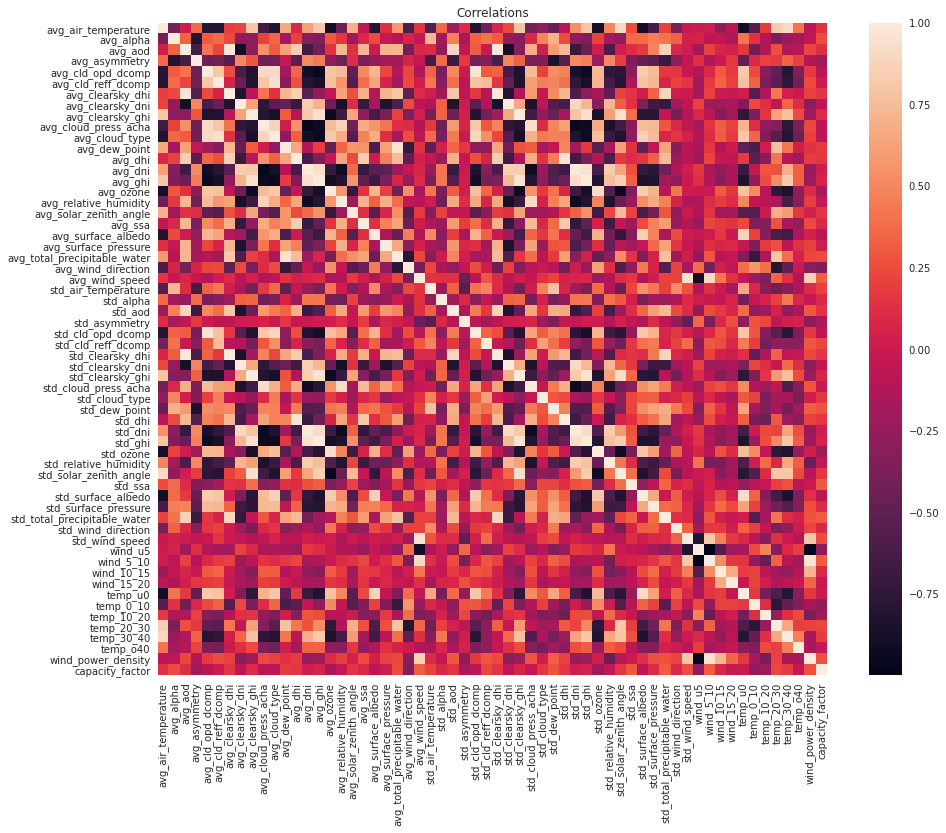

In [69]:
# Create heatmap
plt.figure(figsize=(15,12))
sns.heatmap(df.corr()).set_title('Correlations')
plt.show()

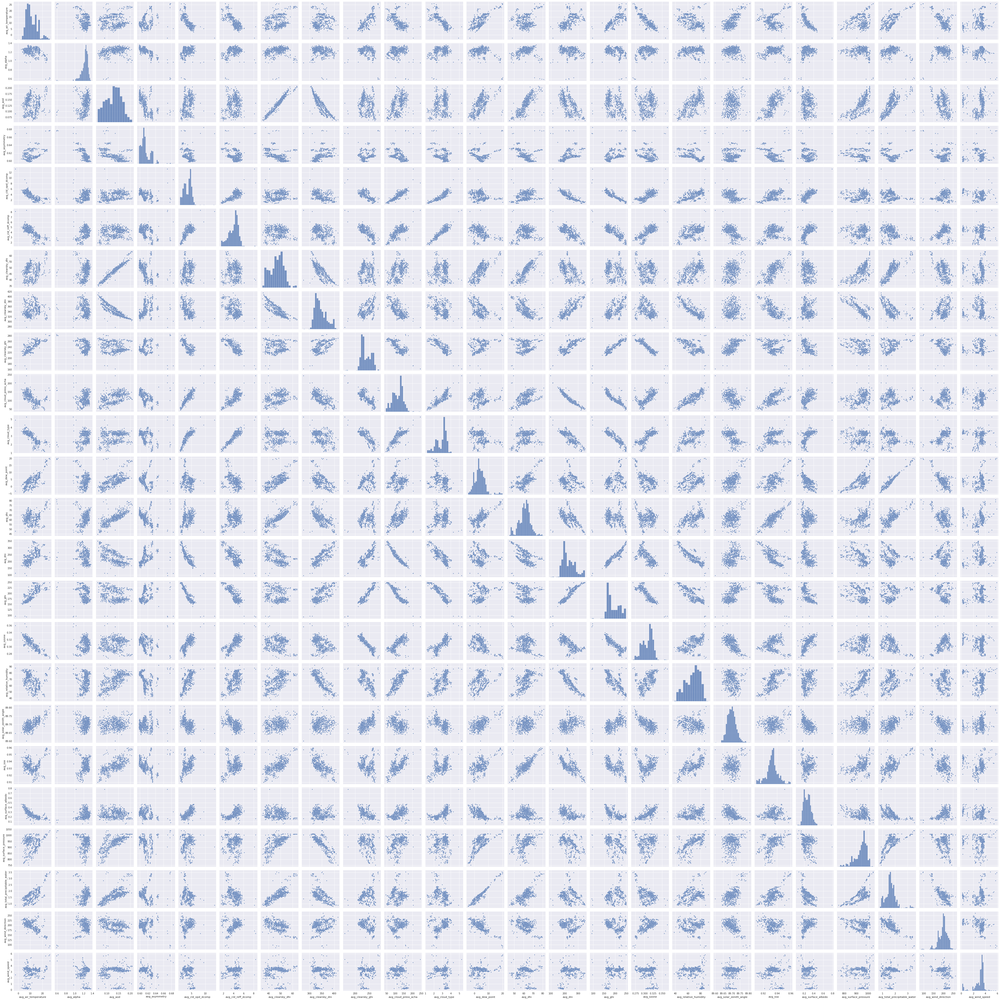

In [78]:
# Create pairplot of average values
avg_features = ['avg_air_temperature', 'avg_alpha', 'avg_aod', 'avg_asymmetry', 'avg_cld_opd_dcomp',
                  'avg_cld_reff_dcomp', 'avg_clearsky_dhi', 'avg_clearsky_dni', 'avg_clearsky_ghi',
                  'avg_cloud_press_acha', 'avg_cloud_type', 'avg_dew_point', 'avg_dhi', 'avg_dni', 'avg_ghi',
                  'avg_ozone', 'avg_relative_humidity', 'avg_solar_zenith_angle', 'avg_ssa', 'avg_surface_albedo',
                  'avg_surface_pressure', 'avg_total_precipitable_water', 'avg_wind_direction', 'avg_wind_speed']

sns.pairplot(df[avg_features], plot_kws={"s": 10})
plt.show()

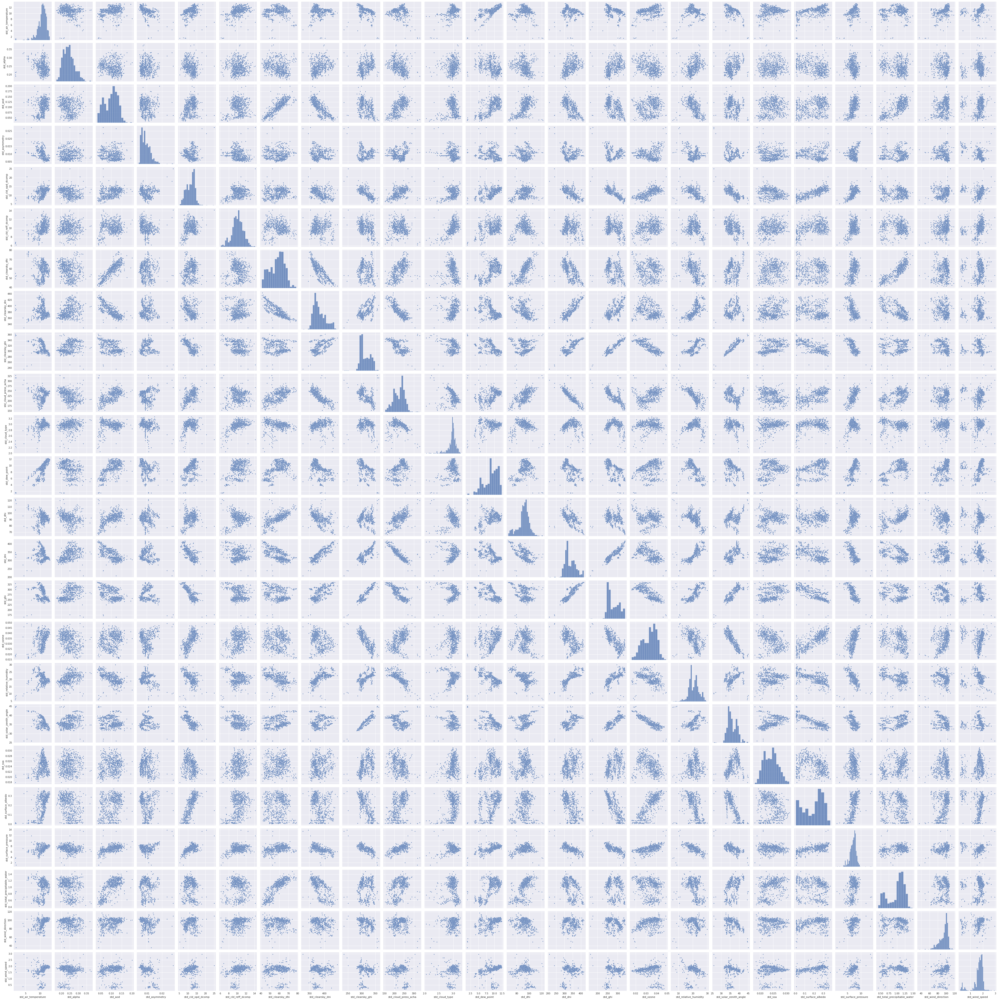

In [79]:
# Create pairplot of SD values
std_features = ['std_air_temperature', 'std_alpha', 'std_aod', 'std_asymmetry', 'std_cld_opd_dcomp',
                'std_cld_reff_dcomp', 'std_clearsky_dhi', 'std_clearsky_dni', 'std_clearsky_ghi',
                'std_cloud_press_acha', 'std_cloud_type', 'std_dew_point', 'std_dhi', 'std_dni', 'std_ghi',
                'std_ozone', 'std_relative_humidity', 'std_solar_zenith_angle', 'std_ssa', 'std_surface_albedo',
                'std_surface_pressure', 'std_total_precipitable_water', 'std_wind_direction', 'std_wind_speed']

sns.pairplot(df[std_features], plot_kws={"s": 10})
plt.show()

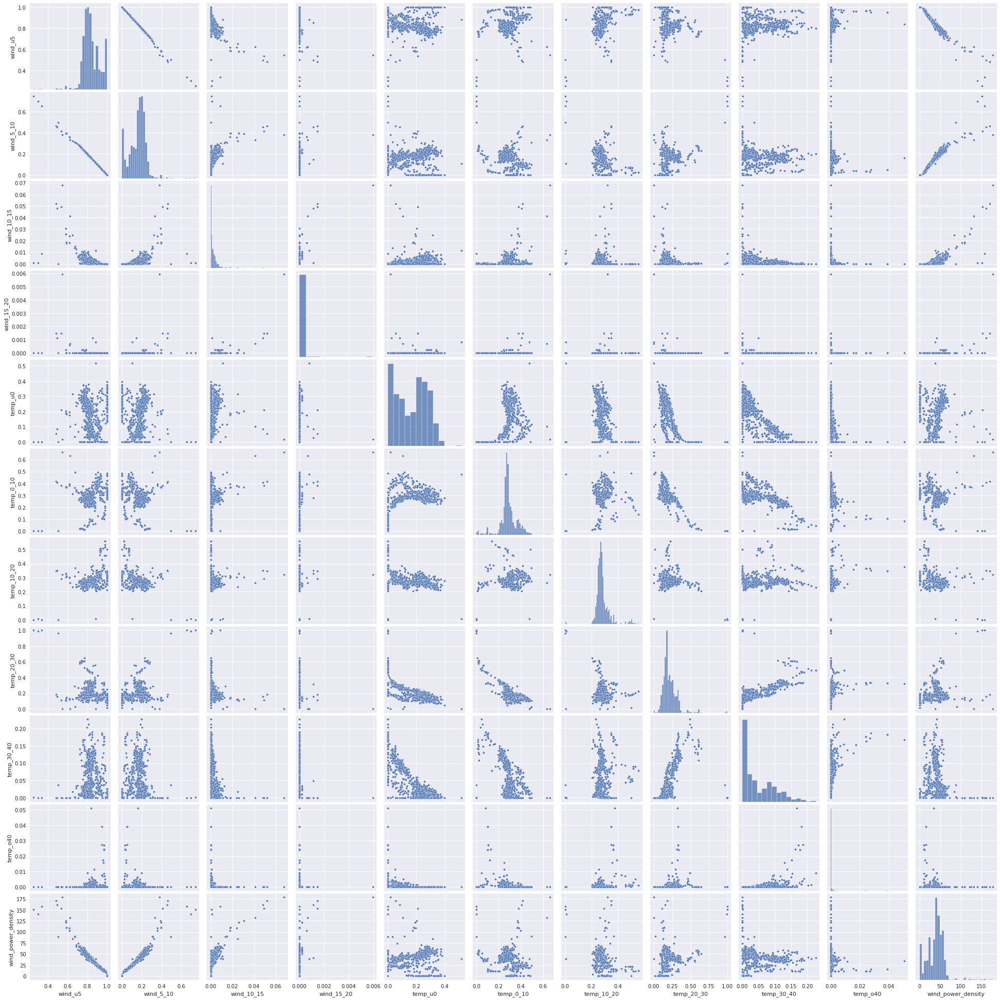

In [80]:
# Create pairplot of newly engineered features
new_features = ['wind_u5', 'wind_5_10', 'wind_10_15', 'wind_15_20', 'temp_u0',
                'temp_0_10', 'temp_10_20', 'temp_20_30', 'temp_30_40', 'temp_o40', 'wind_power_density']

sns.pairplot(df[new_features], plot_kws={"s": 15})
plt.show()

# Create Testing and Training Splits

In [5]:
# Split data for training
X = df.drop('capacity_factor', axis=1)
y = df['capacity_factor'].squeeze()

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0)

# Create and Train XGBoost Model

In [ ]:
# Grid search was used for tuning hyperparameters
# Not using now that the best best values are known
"""
# Define the XGBoost classifier 
xgb1 = xgb.XGBRegressor(random_state=0, 
                        objective='reg:pseudohubererror', 
                        importance_type='total_gain') 
                        #tree_method='gpu_hist', 
                        #gpu_id=0)

# Define the parameter grid
parameter_grid = {#'predictor': ['gpu_predictor'],
                  'learning_rate': [0.003],
                  'max_depth': [6],
                  #'min_child_weight': [1, 2, 3],
                  #'max_delta_step': [2],
                  'subsample': [0.5],
                  #'colsample_bytree': [0.5, 0.6],
                  'n_estimators': [1500]}

# Define the cross-validation splitting strategy
kfold = KFold(n_splits=10, shuffle=True, random_state=7)

# Define the 
xgb_grid = GridSearchCV(estimator=xgb1,
                        param_grid=parameter_grid,
                        scoring='neg_mean_squared_error',
                        cv=kfold,
                        n_jobs = -1,
                        verbose=2)
"""

In [6]:
# Define the XGBoost model for wind
xgb_wind = xgb.XGBRegressor(learning_rate=0.03,
                            max_depth=5, 
                            n_estimators=175,
                            random_state=0, 
                            n_jobs=-1,
                            importance_type='total_gain')

In [7]:
# Keep track of how long the training takes to run
start = time.time()

# Fit the regressor
model = xgb_wind.fit(X_train, y_train)
#model = xgb_grid.fit(X_train, y_train)

# Print the total training time
end = time.time()
total = end - start
print(f'Training time: {total}')

Training time: 0.44043636322021484


# Evaluate the Results

In [8]:
# Get predictions for the test set 
y_pred = model.predict(X_test)

# Calculate R-squared and Mean Absolute Error (MAE)
print(f'R2: {r2_score(y_test, y_pred):.5f}')
print(f'MAE: {mean_absolute_error(y_test, y_pred):.5f}')

R2: 0.34367
MAE: 0.03905


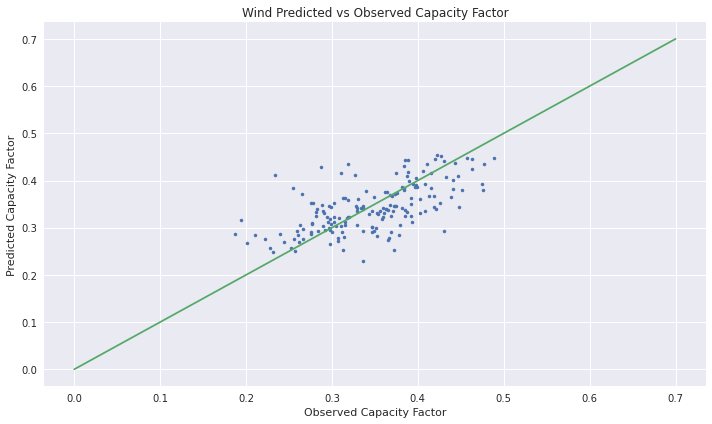

In [10]:
# Plot predictions vs. actual
style.use('seaborn')
sns.set_style(style='darkgrid')

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10,6))

# Add data to plot
ax.plot(y_test, y_pred,'.')

# Add regression line
#m, b = np.polyfit(y_test, y_pred, 1)
#ax.plot(y_test, m*y_test+b)

# Add line of identity
ax.plot([0,0.7],[0,0.7])

# Add title and labels
ax.set_title('Wind Predicted vs Observed Capacity Factor')
ax.set_xlabel('Observed Capacity Factor')
ax.set_ylabel('Predicted Capacity Factor')
plt.tight_layout()

In [ ]:
# Not used now that grid search is done

# Print best score and best parameters
"""
print(f'Best score: {xgb_grid.best_score_:.4f}')
print('Best parameters:')
for key, value in xgb_grid.best_params_.items():
    print(f'{key}: {value}')
"""

In [12]:
# Get feature_importances
# importances = list(xgb_grid.best_estimator_.feature_importances_)
importances = list(xgb_wind.feature_importances_)
feature_importances = [(feature, round(importance, 5)) for feature, importance in zip(df.drop('capacity_factor', axis=1).columns, importances)]

# Sort feature_importances
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print feature_importances
for key, value in feature_importances:
    print(f'{key}: {value:.4f}') 

avg_wind_speed: 0.2768
temp_30_40: 0.1260
avg_asymmetry: 0.0563
avg_wind_direction: 0.0332
std_relative_humidity: 0.0322
avg_ssa: 0.0283
std_dew_point: 0.0242
avg_alpha: 0.0201
std_asymmetry: 0.0199
avg_solar_zenith_angle: 0.0184
std_surface_albedo: 0.0177
avg_clearsky_ghi: 0.0145
std_wind_direction: 0.0143
std_clearsky_dni: 0.0138
std_cld_opd_dcomp: 0.0135
avg_relative_humidity: 0.0130
std_ssa: 0.0128
avg_surface_pressure: 0.0121
std_aod: 0.0117
wind_10_15: 0.0112
avg_air_temperature: 0.0108
std_air_temperature: 0.0107
avg_ozone: 0.0104
std_wind_speed: 0.0104
avg_cld_reff_dcomp: 0.0099
temp_10_20: 0.0098
avg_cloud_type: 0.0092
std_ozone: 0.0090
std_cld_reff_dcomp: 0.0086
std_surface_pressure: 0.0083
std_alpha: 0.0082
avg_cloud_press_acha: 0.0076
std_total_precipitable_water: 0.0074
avg_surface_albedo: 0.0072
std_cloud_type: 0.0071
std_clearsky_dhi: 0.0070
std_cloud_press_acha: 0.0068
temp_20_30: 0.0062
avg_aod: 0.0060
avg_dew_point: 0.0056
wind_power_density: 0.0055
avg_total_precipit

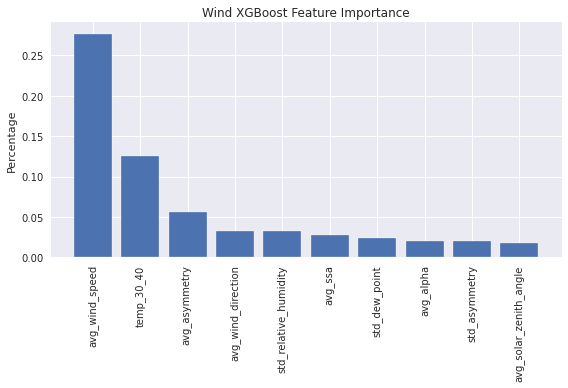

In [13]:
# Plot the most important features

# Set the top number of features to plot
num_features_to_plot = 10

# Create a figure and a set of subplots
fig, ax = plt.subplots()

# Extract feature names and values from feature_importances
features, values = zip(*feature_importances[:num_features_to_plot])

# Add data to plot
ax.bar(features, values)

# Add title and labels
ax.set_title('Wind XGBoost Feature Importance')
ax.set_ylabel('Percentage')
ax.set_xticklabels(features, rotation=90)
plt.tight_layout()